# Benchmarking

ATOM tries to predict the paleo climate in time slices of million years. The atmospheric and the hydrospheric circulations are computed based on the laminar and steady Navier-Stokes equations with additional transport equations for the water vapour, cloud water, cloud ice resulting in precipitation predictions and for the salinity transport. The ocean surface water velocity distribution results from the surface wind velocity distribution of the atmospheric circulations. 

The code is written for laptop usage, which makes approximations necessary, one of which is the assumption of a laminar and steady flow environment. The application of the 4th order Runge-Kutta solution scheme including immersed boundary conditions and the assumption of a sperical orthogonal coordinate system makes the code fast.

ATOM's main fluid dynamical features, Atmosphere and Hydrosphere, are permanently in development. Changements are uploaded to GitHub.

This code allows the vizualisation of the results for time slices the user prescribes. For the modern world the results are comparable to NASA measurements.


In [1]:
import sys
import matplotlib.pyplot as plt
import os.path
import numpy as np
import shutil
import pyatom

from mpl_toolkits.basemap import Basemap
from pyatom import Model, Atmosphere, Hydrosphere

from numpy import linspace
from numpy import meshgrid

model = Model()

# for "a_h = atm" only the atmospheric circulation used:
a_h = 'atmosphere'
#a_h = 'hydrosphere'     # the transfer file with the extension *.vw from the corresponding atm-run must be available!
#a_h = 'atmosphere and hydrosphere'

# for "rebuild = True" old output files are deleted:
rebuild = False

# applied configuration files for atmosphere and/or hydrosphere are named:
config_xml_atm = 'config_atm.xml'
config_xml_hyd = 'config_hyd.xml'

# time slices in Ma to be compared are named:
time_slice = [ 0, 10 ]
#time_slice = [ 0 ]
#time_slice = [ 10 ]




# applied time slices
for t_s in time_slice:
    print 'time slice in Ma = ', t_s
            
    # naming the output paths
    output_path = 'output-%s/' % t_s
    print 'output path = ', output_path
            
    # deleting old output paths in case "rebuild = True"
    if rebuild:
        shutil.rmtree ( output_path )

    if a_h == 'atmosphere':
        # runing the atmosphere model
        print 'run model: time slice in Ma = ', t_s, '   output path = ', output_path, '   configuration file = ', config_xml_atm
        model.run_atm( t_s, output_path, config_xml_atm )
    elif a_h == 'hydrosphere':        
        # runing the hydrosphere model
        print 'run model: time slice in Ma = ', t_s, '   output path = ', output_path, '   configuration file = ', config_xml_hyd
        model.run_hyd( t_s, output_path, config_xml_hyd )
    elif a_h == 'atmosphere and hydrosphere':        
        # runing the atmosphere model
        print 'run model: time slice in Ma = ', t_s, '   output path = ', output_path, '   configuration file = ', config_xml_atm
        model.run_atm( t_s, output_path, config_xml_atm )
        # runing the hydrosphere model
        print 'run model: time slice in Ma = ', t_s, '   output path = ', output_path, '   configuration file = ', config_xml_hyd
        model.run_hyd( t_s, output_path, config_xml_hyd )

print 'end of benchmark session running %s' % a_h


time slice in Ma =  0
output path =  output-0/
run model: time slice in Ma =  0    output path =  output-0/    configuration file =  config_atm.xml
0
output-0/
config_atm.xml

   Output is being written to output-0
   Ma = 0
   bathymetry_path = ../data/Paleotopography_bathymetry/Golonka_rev210
   bathymetry_filepath = ../data/Paleotopography_bathymetry/Golonka_rev210/0Ma_Golonka.xyz




***** Atmosphere General Circulation Model ( AGCM ) applied to laminar flow
***** program for the computation of geo-atmospherical circulating flows in a spherical shell
***** finite difference scheme for the solution of the 3D Navier-Stokes equations
***** with 4 additional transport equations to describe the water vapour, cloud water, cloud ice and co2 concentration
***** 4th order Runge-Kutta scheme to solve 2nd order differential equations inside an inner iterational loop
***** Poisson equation for the pressure solution in an outer iterational loop
***** multi-layer and two-layer radiation model fo


 residuum: continuity equation ..... =    60.498722   33°N  81°E  5500 m
 dp: pressure Poisson equation ..... =     0.000000   90°S   0°W 20000 m
 du: Navier Stokes equation ........ =     0.005288   89°S 177°E  3000 m
 dv: Navier Stokes equation ........ =     0.063590   49°N   0°W     0 m
 dw: Navier Stokes equation ........ =     0.797375   33°N  80°E  5500 m
 dt: energy transport equation ..... =     0.174202   90°S  92°E  2500 m
 dc: vapour transport equation ..... =     0.006542    7°S  79°W   500 m
 dcloud: cloud transport equation .. =     0.003359    7°S  79°W  3000 m
 dice: ice transport equation ...... =     0.000993    0°N  78°W  4500 m
 dco: CO2 transport equation ....... =     0.680893   28°N  88°E     0 m



 printout of maximum and minimum values of properties at their locations: latitude, longitude, level
 results based on three dimensional considerations of the problem

 max 3D temperature ...... =    33.109215     C   15°N  13°W     0 m           min 3D temperature 

 precipitable water average ............ =   19.88    mm    Evaporation_Haude_average per year .... =  479.32  mm/a    Evaporation_Haude_average per day ..... =    1.31  mm/d
 co2_average ........................... =  301.25   ppm    Evaporation_Penman_average per year ... =  771.68  mm/a    Evaporation_Penman_average per day .... =    2.11  mm/d


  present state of the computation 
  current time slice, number of iterations, maximum and current number of velocity iterations, maximum and current number of pressure iterations 

  Ma = 0	 n = 2    velocity_iter_max = 2     velocity_iter = 2    pressure_iter_max = 2    pressure_iter = 1


      >>>>>>>>>>>>>>>>>>>>>>>>>>>>>    3D    <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
      3D AGCM iterational process
      max total iteration number nm = 200
      outer pressure loop:  max iteration number pressure_iter_max = 2
      inner velocity loop:  max iteration number velocity_iter_max = 2

      n = 2     velocity_iter = 2     pressure_iter 

     0 m   33°S 151°E   Evaporation Penman ..... =    0.06  mm/d    Evaporation Haude ...... =    1.12  mm/d

 Equator in the central Pacific
     0 m    0°N 180°E   radiation emission...... =  458.51  W/m2    latent heat ............ =    0.19  W/m2    sensible heat .......... =    3.18  W/m2    bottom heat ............ =  455.14  W/m2
     0 m    0°N 180°E   precipitable water ..... =   44.90    mm    latent heat surf ....... =    0.00  W/m2    Condensation heat surf . =   -2.56  W/m2    Evaporation heat surf .. =    0.00  W/m2
     0 m    0°N 180°E   precipitation .......... =    0.00  mm/d    latent heat 2D ......... =    0.00  W/m2    Condensation heat 2D ... =    0.00  W/m2    Evaporation heat 2D .... =    0.00  W/m2
     0 m    0°N 180°E   Evaporation Penman ..... =    6.80  mm/d    Evaporation Haude ...... =    4.70  mm/d


 precipitable water average ............ =   19.90    mm    precipitation average per year ........ =    0.00  mm/a    precipitation average per day .......


 City of Dresden, Germany, Europe
     0 m   51°N  14°E   radiation emission...... =  329.62  W/m2    latent heat ............ =    0.07  W/m2    sensible heat .......... =    1.68  W/m2    bottom heat ............ =  327.86  W/m2
     0 m   51°N  14°E   precipitable water ..... =   16.38    mm    latent heat surf ....... =   -4.93  W/m2    Condensation heat surf . =   -0.09  W/m2    Evaporation heat surf .. =    0.00  W/m2
     0 m   51°N  14°E   precipitation .......... =    1.25  mm/d    latent heat 2D ......... =   -4.93  W/m2    Condensation heat 2D ... =    0.00  W/m2    Evaporation heat 2D .... =   -4.93  W/m2
     0 m   51°N  14°E   Evaporation Penman ..... =    1.54  mm/d    Evaporation Haude ...... =    0.11  mm/d

 City of Sydney, New South Wales, Australia
     0 m   33°S 151°E   radiation emission...... =  369.42  W/m2    latent heat ............ =   -0.04  W/m2    sensible heat .......... =    1.85  W/m2    bottom heat ............ =  367.62  W/m2
     0 m   33°S 151°E  

 max 2D Q latent ......... =     0.499468  W/m2   48°S 170°E     0 m           min 2D Q latent ......... =    -0.491493  W/m2   20°N  47°E     0 m
 max 2D Q sensible ....... =     3.414936  W/m2   15°S  12°E     0 m           min 2D Q sensible ....... =    -1.241380  W/m2    7°S  79°W     0 m
 max 2D Q bottom ......... =   495.045240  W/m2   15°N  13°W     0 m           min 2D Q bottom heat .... =   212.340991  W/m2   89°S  75°E     0 m
 max 2D latent heat ...... =    15.283223  W/m2   34°N  53°E     0 m           min 2D latent heat ...... =   -14.029922  W/m2    4°N  33°E     0 m
 max 2D Condensation ..... =    15.283223  W/m2   34°N  53°E     0 m           min 2D Condensation ..... =     0.000000  W/m2   85°N  72°W     0 m
 max 2D Evaporation ...... =     0.000000  W/m2   90°N   0°E     0 m           min 2D Evaporation ...... =   -14.029922  W/m2    4°N  33°E     0 m

 secondary data: 

 max Evaporation Penman .. =     7.424158  mm/d   15°S  12°E     0 m           min Evaporation Pen

 dp: pressure Poisson equation ..... =     0.000000   90°S   0°W
 dv: Navier Stokes equation ........ =     0.026091   27°S 113°E
 dw: Navier Stokes equation ........ =     0.121319   33°S 154°E


  present state of the computation 
  current time slice, number of iterations, maximum and current number of velocity iterations, maximum and current number of pressure iterations 

  Ma = 10     n = 1    velocity_iter_max = 2     velocity_iter = 1    pressure_iter_max = 2    pressure_iter = 1


      >>>>>>>>>>>>>>>>>>>>>>>>>>>>>    2D    <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
      2D AGCM iterational process
      max total iteration number nm = 200
      outer pressure loop:  max iteration number pressure_iter_max_2D = 2
      inner velocity loop:  max iteration number velocity_iter_max_2D = 2

      n = 1     velocity_iter_2D = 2     pressure_iter_2D = 1     Ma = 10



 2D iterational process for the surface boundary conditions
 printout of maximum and minimum absolute and relative error

 max precipitation ....... =     0.000000  g/kg   90°N   0°E     0 m           min precipitation ....... =     0.000000  g/kg   90°N   0°E     0 m
 max precipitable water .. =     0.000000    mm   90°N   0°E     0 m           min precipitable water .. =     0.000000    mm   90°N   0°E     0 m
 max precipitable water .. =     0.000000  g/kg   90°N   0°E     0 m           min precipitable water .. =     0.000000  g/kg   90°N   0°E     0 m

 energies at see level without convection influence: 

 max 2D Q radiation ...... =     0.000000  W/m2   90°N   0°E     0 m           min 2D Q radiation ...... =     0.000000  W/m2   90°N   0°E     0 m
 max 2D Q latent ......... =     0.000000  W/m2   90°N   0°E     0 m           min 2D Q latent ......... =     0.000000  W/m2   90°N   0°E     0 m
 max 2D Q sensible ....... =     0.000000  W/m2   90°N   0°E     0 m           min 2D Q sensible ....... =     0.000000  W/m2   90°N   0°E     0 m
 max 2D Q bottom ......... =     0.000000  W/m2   90°N   0°E  

 max 3D rain ............. =     0.000000  g/kg   90°N   0°E     0 m           min 3D rain ............. =     0.000000  g/kg   90°N   0°E     0 m
 max 3D snow ............. =     0.000000  g/kg   90°N   0°E     0 m           min 3D snow ............. =     0.000000  g/kg   90°N   0°E     0 m
 max 3D co2 .............. =   423.542533   ppm    0°N   0°E     0 m           min 3D co2 .............. =     0.000000   ppm   90°N   0°E 16000 m
 max 3D epsilon .......... =     0.792965     %    1°S 118°E     0 m           min 3D epsilon .......... =     0.011217     %   90°S   0°E 20000 m
 max 3D buoyancy force ... =     0.093855  N/m2    0°N  38°E     0 m           min 3D buoyancy force ... =     0.000000  N/m2   90°N   0°E     0 m

 printout of maximum and minimum values of properties at their locations: latitude, longitude
 results based on two dimensional considerations of the problem

 co2 distribution columnwise: 

 max co2_total ........... =   423.542533   ppm    0°N   1°E     0 m     


 energies in the three dimensional space: 

 max 3D radiation ........ =   478.388764  W/m2    1°S 118°E     0 m           min 3D radiation ........ =   123.089434  W/m2    5°N   0°E 20000 m
 max 3D sensible heat .... =    51.642467  W/m2    1°N 104°E  1500 m           min 3D sensible heat .... =   -35.215452  W/m2   30°N  32°E  3000 m
 max 3D latent heat ...... =    42.245736  W/m2   27°S  24°E  2000 m           min 3D latent heat ...... =   -70.671441  W/m2    2°S 119°E  2500 m
 max 3D condensation temp  =     5.818743     C    2°S 119°E  2500 m           min 3D condensation temp  =    -8.997781     C    1°N 104°E  1000 m
 max 3D evaporation temp . =     8.493432     C   90°S 148°E  2500 m           min 3D evaporation temp . =    -6.610560     C   58°S  60°E  1000 m

 greenhouse gases: 

 max 3D water vapour ..... =    13.601823  g/kg    6°N 109°E     0 m           min 3D water vapour ..... =     0.155166  g/kg   90°S 152°E 10000 m
 max 3D cloud water ...... =     5.924298  g/kg    


 residuum: continuity equation ..... =     0.002534   33°N  11°E  2000 m
 dp: pressure Poisson equation ..... =     1.277543   33°N  25°E     0 m
 du: Navier Stokes equation ........ =     0.001455   31°N   8°E  2500 m
 dv: Navier Stokes equation ........ =     0.007242   28°N   0°W   500 m
 dw: Navier Stokes equation ........ =     0.037216   33°S  72°W  2000 m
 dt: energy transport equation ..... =     0.092484    6°N   0°W     0 m
 dc: vapour transport equation ..... =     0.003340   34°N   0°W   500 m
 dcloud: cloud transport equation .. =     0.002238   34°N   0°W  2000 m
 dice: ice transport equation ...... =     0.000215   29°N  35°E  1500 m
 dco: CO2 transport equation ....... =     0.007620   90°S 154°E   500 m



 printout of maximum and minimum values of properties at their locations: latitude, longitude, level
 results based on three dimensional considerations of the problem

 max 3D temperature ...... =    29.919890     C    1°S 118°E     0 m           min 3D temperature 

 precipitable water average ............ =   20.58    mm    Evaporation_Haude_average per year .... =  413.92  mm/a    Evaporation_Haude_average per day ..... =    1.13  mm/d
 co2_average ........................... =  382.40   ppm    Evaporation_Penman_average per year ... =  677.91  mm/a    Evaporation_Penman_average per day .... =    1.86  mm/d



***** end of the Atmosphere General Circulation Modell ( AGCM ) *****

end of benchmark session running atmosphere


# Plot function: plot_xyz(topo, series, title, lats, lons)

Preparation of a Basemap instance with the corresponding longitudinal and latitudinal coordinates for modern world and palaeo time plots for all atmosphere and hydrosphere results given by ATOM.

In [2]:
import matplotlib.pyplot as plt

from mpl_toolkits.basemap import Basemap
import numpy as np
from numpy import linspace
from numpy import meshgrid

def plot_xyz(topo, series, title, lats, lons):

    plt.figure(figsize=(15, 8))

    m = Basemap(llcrnrlon=-180,llcrnrlat=-90,urcrnrlon=180,urcrnrlat=90,projection='kav7', lon_0=0)

    old_lons = lons
    lons, topo = m.shiftdata(old_lons, datain = topo, lon_0=0)
    lons, series = m.shiftdata(old_lons, datain = series, lon_0=0)

    xi, yi = m(lons, lats)
    
    cs = m.scatter(xi, yi, marker='.', c=series, alpha=0.5, lw=0)

    # Add Grid Lines
    m.drawparallels(np.arange(-90., 90., 10.), labels=[1,0,0,0], fontsize=10)
    m.drawmeridians(np.arange(-180., 180., 45.), labels=[0,0,0,1], fontsize=10)


    if Ma == 0:
        m.drawcoastlines()   
        #m.barbs(xi[points], yi[points], adata[points, 4], adata[points, 3], pivot='middle', barbcolor='#333333')

    else:  
        #m.drawcoastlines()
        con_topo = m.contour( xi.reshape((361,181)), yi.reshape((361,181)), topo.reshape((361,181)),
                        colors ='k', linewidths= 0.3 )

    # Add Colorbar
    cbar = m.colorbar(cs, location='bottom', pad="10%")
    # cbar.set_label(tmax_units)

    # Add Title
    plt.title(title)
    #print plt.title(title)

    plt.show()

# Prepare Atmosphere outputs

The outputs are given for example in `output-0/[0Ma_Golonka.xyz]_PlotData_Atm.xyz` files. 

Additional results must be prepared in the PostProcess_Atm.cpp in the class method  PostProcess_Atmosphere::Atmosphere_PlotData()


In [3]:
# Plot of Atmosphere outputs first set
def atm_out_velocities():
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    for index in range(3, 6):
        title = atm_header[index]
        plot_xyz(topo, adata[:, index], title + '  ATOM atmosphere at Ma=%s' % Ma, alats, alons)     
        

In [4]:
# Plot of Atmosphere outputs second set
def atm_out_temp_vap():
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]
    for index in range(6, len(atm_header)):
        title = atm_header[index]
        plot_xyz(topo, adata[:, index], title + '  ATOM atmosphere at Ma=%s' % Ma, alats, alons)


# Prepare Hydrosphere outputs

The outputs are given for example in `output-0/[0Ma_Golonka.xyz]_PlotData_Hyd.xyz` files. 

Additional results must be prepared in the PostProcess_Hyd.cpp in the class method  PostProcess_Hydrosphere::Hydrosphere_PlotData()

In [5]:
# Plot of Hydrosphere outputs first set
def hyd_out_velocities():
    hlats = -(hdata[:, 1] - 90)
    hlons = hdata[:, 0]
    topo = hdata[:, 2]

    for index in range(3, 6):
        title = hyd_header[index]
        plot_xyz(topo, hdata[:, index], title + '  ATOM hydrosphere at Ma=%s' % Ma, hlats, hlons)


In [6]:
# Plot of Hydrosphere outputs second set
def hyd_out_temp_sal():
    hlats = -(hdata[:, 1] - 90)
    hlons = hdata[:, 0]
    topo = hdata[:, 2]

    for index in range(6, 8):
        title = hyd_header[index]
        plot_xyz(topo, hdata[:, index], title + '  ATOM hydrosphere at Ma=%s' % Ma, hlats, hlons)


In [7]:
# Plot of Hydrosphere outputs third set
def hyd_out_updownwelling():
    hlats = -(hdata[:, 1] - 90)
    hlons = hdata[:, 0]
    topo = hdata[:, 2]

    for index in range(8, len(hyd_header)):
        title = hyd_header[index]
        plot_xyz(topo, hdata[:, index], title + '  ATOM hydrosphere at Ma=%s' % Ma, hlats, hlons)


# Compare surface temperature

ATOM's temperature distribution for the modern world can be compared to NASA's measured temperatures.
ATOM also can start with NASA's measured temperature distribution as initial condition. This must be changed in cAtmosphereModel.cpp.



In [22]:
# st: Surface Temperature
def temp_NASA_ATOM():
    st = np.genfromtxt('../data/SurfaceTemperature_NASA.xyz')
    # columns lons, lats, temp
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    plot_xyz(topo, series=st[:, 2], title='Surface Temperature_NASA (Celsius) at Ma=0', lons=st[:, 0], lats=st[:, 1])
    plot_xyz(topo, adata[:, 6], 'ATOM atmosphere temperature (Celsius) at Ma=%s' % Ma, alats, alons)


# Compare surface precipitation

ATOM's precipitation for the modern world can be compared to NASA's measured precipitation.


In [23]:
# nsp: NASA Surface Precipitation
def prec_NASA_ATOM():
    nsp = np.genfromtxt('../data/SurfacePrecipitation_NASA.xyz')
    # columns lons, lats, precip
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    plot_xyz(topo, series=nsp[:, 2], title='NASA Surface Precipitation (mm/d) at Ma=0', lons=nsp[:, 0], lats=nsp[:, 1])
    plot_xyz(topo, adata[:, 8], 'ATOM precipitation (mm/d) at Ma=%s' % Ma, alats, alons)


# Surface Winds benchmarking

Surface wind patterns from measured data sets to compare with ATOM results for Ma = 0 ( modern times ).

Reference data comes from https://podaac.jpl.nasa.gov/dataset/QSCAT_L3_SFC_WIND_SPEED_1DEG_1MO
     

In [24]:
# load windspeed data
def sfcWind_QuikSCAT():
    from netCDF4 import Dataset
    root = Dataset('windspeed/sfcWind_QuikSCAT_L2B_v20110531_199908-200910.nc')
    # print root
    # print root.dimensions.keys()
    #print root.variables.keys()
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    t = root.variables['time'][-1]  # just take the newest timeslice

    # NOTE: wind mags vary substantially with time; what time should we be using? or average it all out?

    swlats = root.variables['lat'][:]
    swlons = root.variables['lon'][:]
    swspeed = root.variables['sfcWind'][-1]

    lonv, latv = np.meshgrid(swlons, swlats)

    plot_xyz(topo, lats=latv.flatten(), lons=lonv.flatten(), title='Surface Wind QuikSCAT', series=swspeed.flatten())

    root.close()

In [25]:
# load windspeed data
def uas_QuikSCAT():
    import netCDF4
    from netCDF4 import Dataset
    root = Dataset('windspeed/uas_QuikSCAT_L2B_v20110531_199908-200910.nc')
    #print root.variables.keys()
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    t = root.variables['time'][-1]  # just take the newest timeslice

    # NOTE: wind mags vary substantially with time; what time should we be using? or average it all out?

    swlats = root.variables['lat'][:]
    swlons = root.variables['lon'][:]
    swspeed = root.variables['uas'][-1]

    lonv, latv = np.meshgrid(swlons, swlats)

    plot_xyz(topo, lats=latv.flatten(), lons=lonv.flatten(), title='Surface Wind QuikSCAT u-mag', series=swspeed.flatten())

    root.close()

In [26]:
# load windspeed data
def vas_QuikSCAT():
    from netCDF4 import Dataset
    root = Dataset('windspeed/vas_QuikSCAT_L2B_v20110531_199908-200910.nc')
    #print root.variables.keys()
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    t = root.variables['time'][-1]  # just take the newest timeslice

    # NOTE: wind mags vary substantially with time; what time should we be using? or average it all out?

    swlats = root.variables['lat'][:]
    swlons = root.variables['lon'][:]
    swspeed = root.variables['vas'][-1]

    lonv, latv = np.meshgrid(swlons, swlats)

    plot_xyz(topo, lats=latv.flatten(), lons=lonv.flatten(), title='Surface Wind QuikSCAT v-mag', series=swspeed.flatten())

    root.close()

# Surface Currents benchmarking

Surface currents from measured data sets to compare with ATOM results for Ma = 0 ( modern times ).

Using data from https://podaac.jpl.nasa.gov/dataset/OSCAR_L4_OC_third-deg


In [27]:
# load surface current data
from netCDF4 import Dataset

def oscar_current():
    root = Dataset('oscar/oscar_vel8879.nc')
    #print root.variables.keys()
    alats = -(adata[:, 1] - 90.)
    alons = adata[:, 0]
    topo = adata[:, 2]

    sclats = root.variables['latitude'][:]
    sclons = root.variables['longitude'][:]
    u = root.variables['u'][0][0][:]
    v = root.variables['v'][0][0][:]

    lonv, latv = np.meshgrid(sclons, sclats)

    plot_xyz(topo, lats=latv.flatten(), lons=lonv.flatten(), title='OSCAR Surface Currents u-mag', series=np.log(u.flatten()))
    plot_xyz(topo, lats=latv.flatten(), lons=lonv.flatten(), title='OSCAR Surface Currents v-mag', series=v.flatten())

    root.close()

# Plot all Atmosphere and Hydrosphere outputs

Depending on the parameters given: 

time slices in Ma

a_h = 'atmosphere and/or hydrosphere'

additional parameters can be set to reduce the number of plots

time slice in        Ma =  0
name of the output path =  output-0/


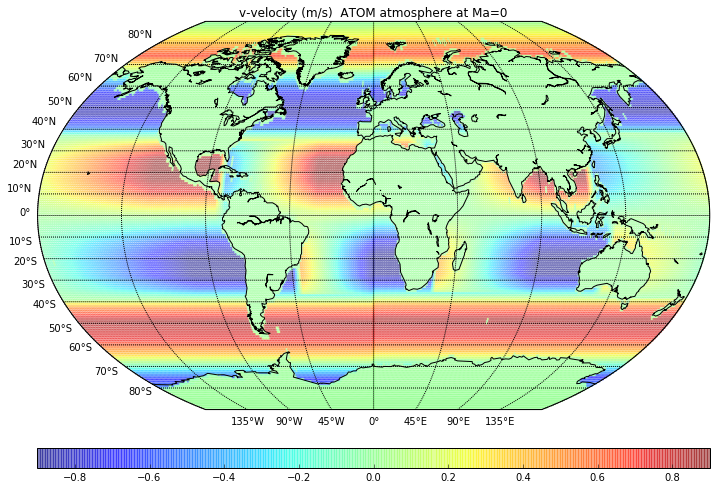

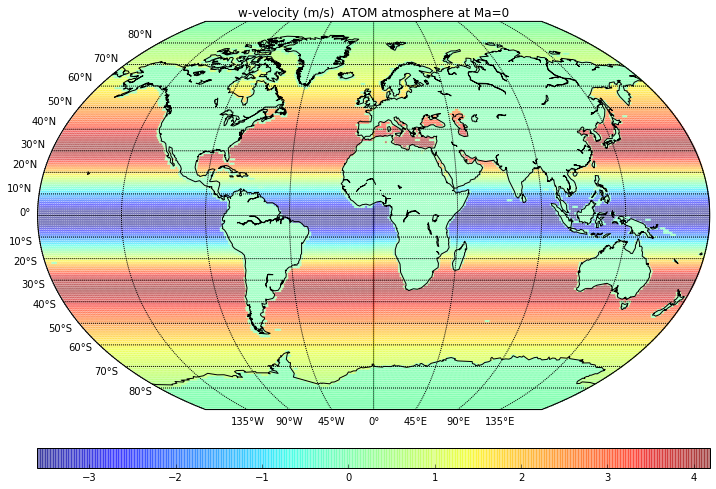

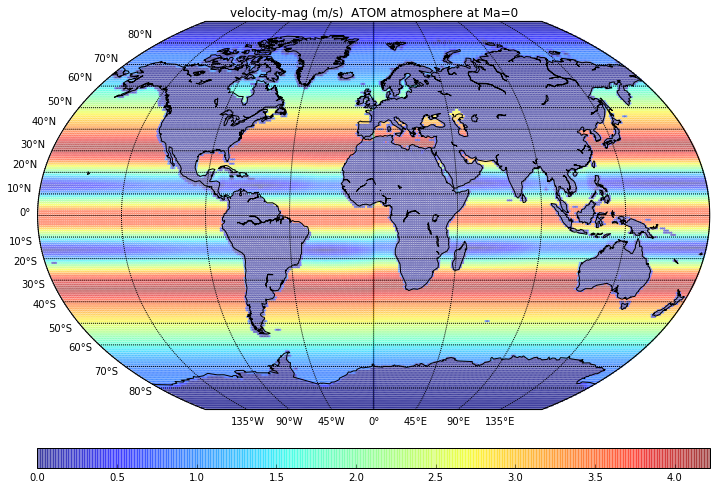

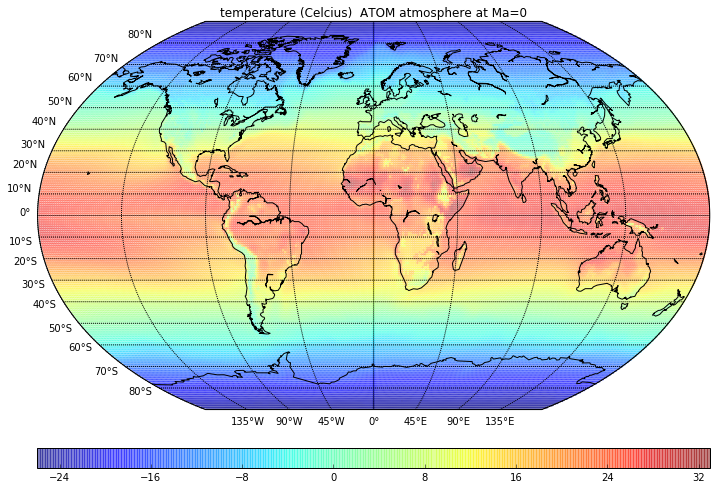

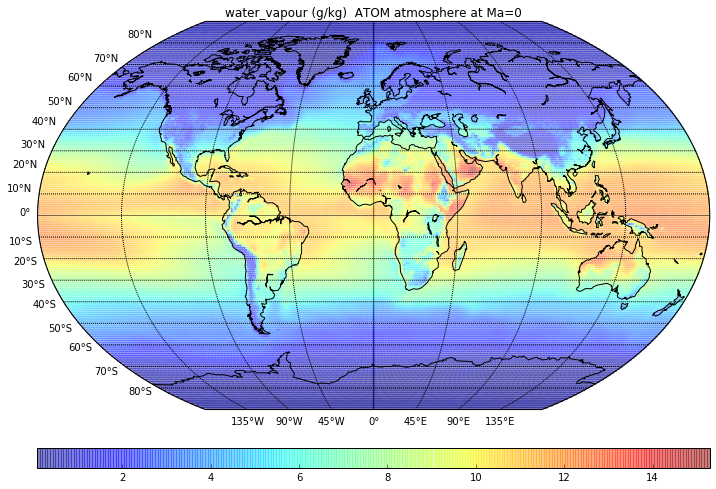

...

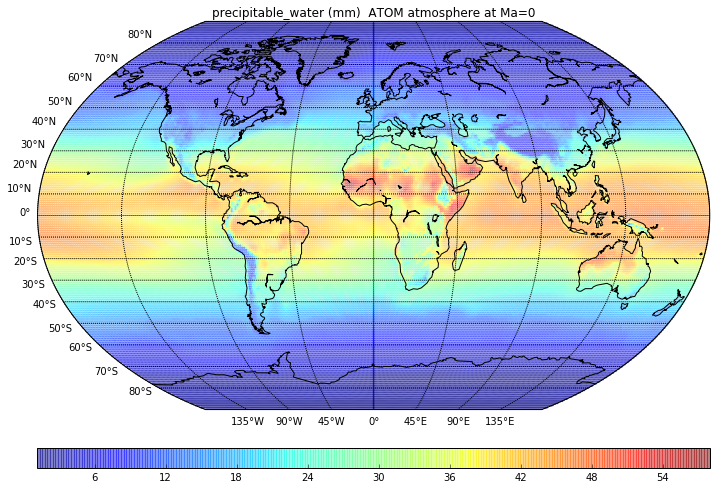

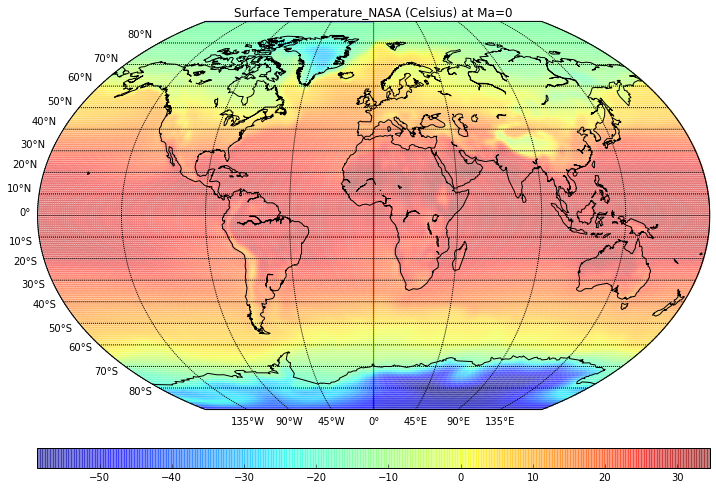

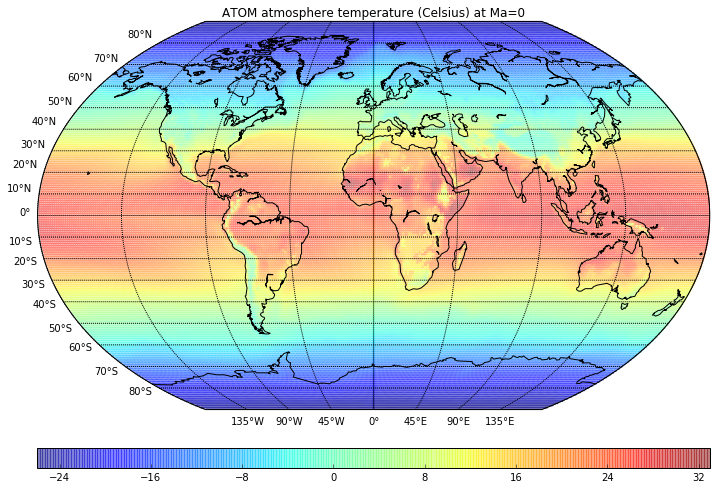

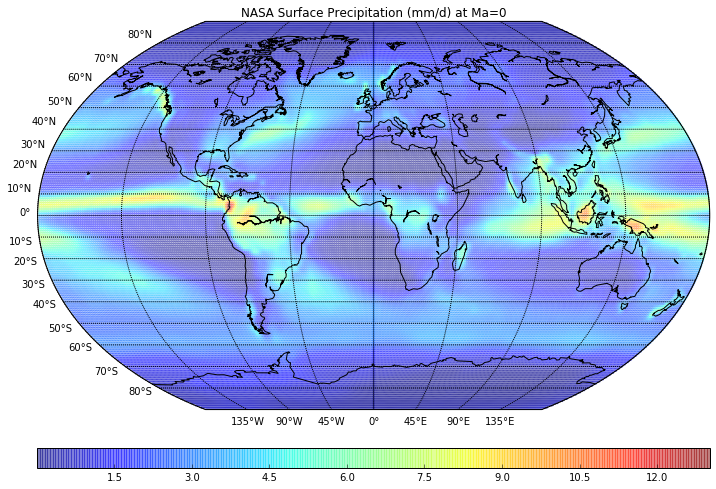

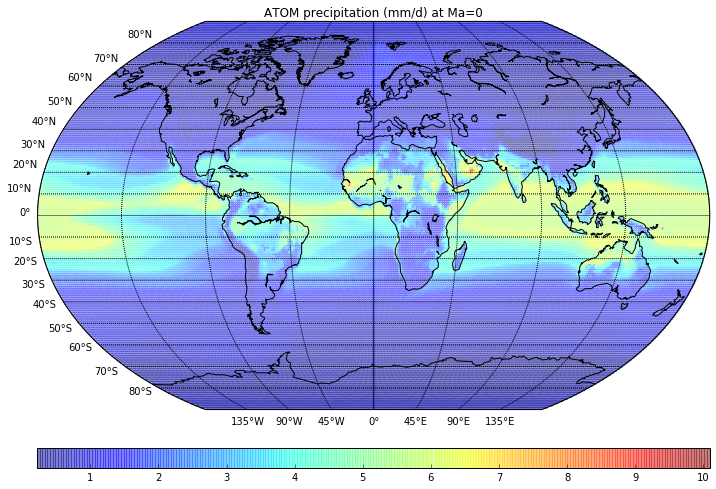

time slice in        Ma =  10
name of the output path =  output-10/


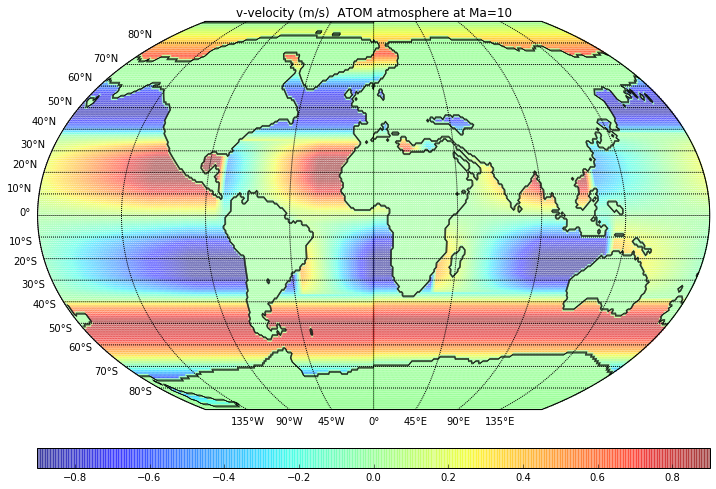

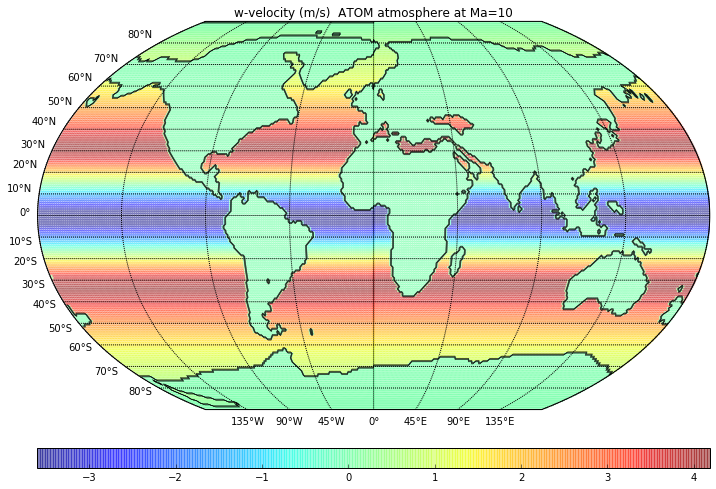

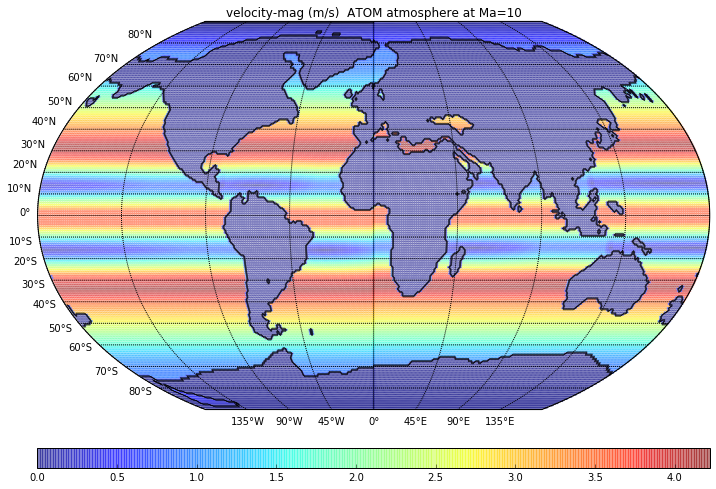

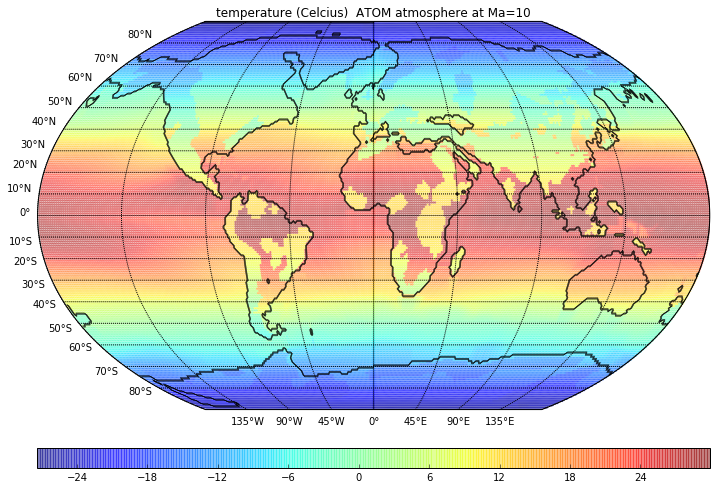

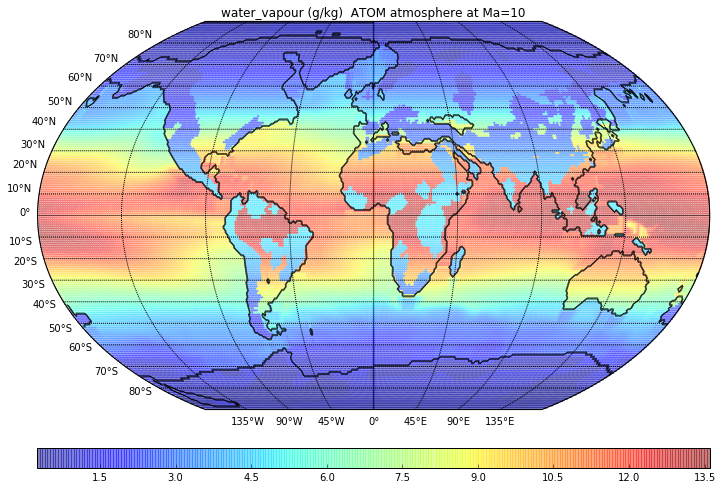

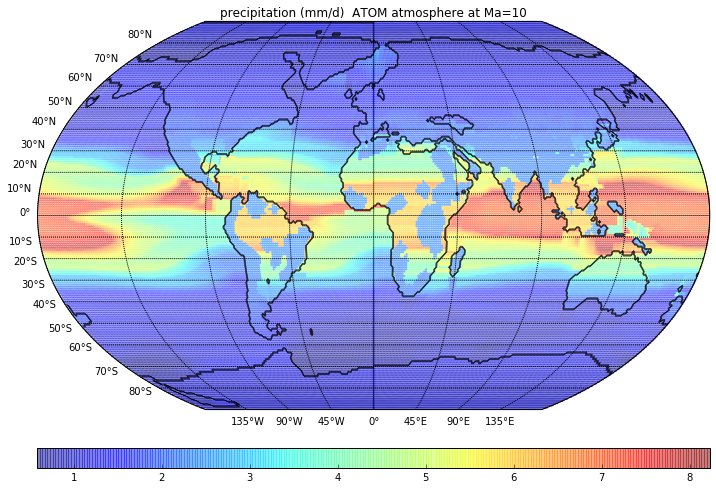

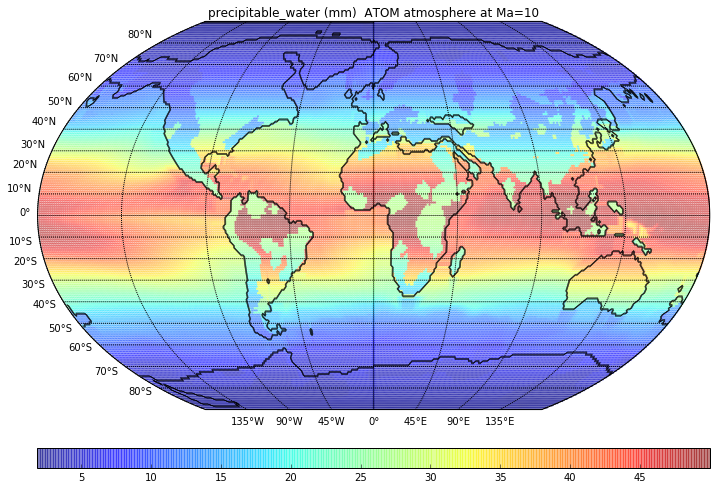

In [28]:
# running the plots chosen from the ATOM ouput data sets
import os.path
import numpy as np


# if "vel = True" surface velocity plots are shown:
vel = True
#vel = False

# if "temp_vap = True" surface temperature, water vapour, precipitation and precipitable water polts are shown:
temp_vap = True
#temp_vap = False

# if "temp_sal = True" surface temperature, and surface salinity polts are shown:
temp_sal = True
#temp_sal = False

# if "up_down = True" bottom water, upwelling and downwelling polts are shown:
up_down = True
#up_down = False

# if "temp_NASA = True" surface temperature by NASA and ATOM polts are shown:
temp_NASA = True
#temp_NASA = False

# if "prec_NASA = True" surface precipitation by NASA and ATOM polts are shown:
prec_NASA = True
#prec_NASA = False

# if "QuikSCAT = True" surface atmospheric velocities by QuikSCAT and ATOM polts are shown:
#QuikSCAT = True
QuikSCAT = False

# if "oscar_current = True" surface current velocities by OSCAR and ATOM polts are shown:
#oscar_current = True
oscar_cur = False


for t_s in time_slice:
    print 'time slice in        Ma = ', t_s

    Ma = t_s
    datapath = 'output-%s/' % Ma
    print 'name of the output path = ', datapath

    atm_header = ['lats (deg)', 'lons (deg)', 'topography', 'v-velocity (m/s)', 'w-velocity (m/s)', 'velocity-mag (m/s)', 'temperature (Celcius)', 'water_vapour (g/kg)', 'precipitation (mm/d)', 'precipitable_water (mm)']
    hyd_header = ['lats (deg)', 'lons (deg)', 'topography', 'v-velocity (m/s)', 'w-velocity (m/s)', 'velocity-mag (m/s)', 'temperature (Celsius)', 'salinity (psu)', 'bottom_water (m/s)', 'upwelling (m/s)', 'downwelling (m/s)']

    if a_h == 'atmosphere and hydrosphere':
        atm_header = ['lats (deg)', 'lons (deg)', 'topography', 'v-velocity (m/s)', 'w-velocity (m/s)', 'velocity-mag (m/s)', 'temperature (Celcius)', 'water_vapour (g/kg)', 'precipitation (mm/d)', 'precipitable_water (mm)']
        hyd_header = ['lats (deg)', 'lons (deg)', 'topography', 'v-velocity (m/s)', 'w-velocity (m/s)', 'velocity-mag (m/s)', 'temperature (Celsius)', 'salinity (psu)', 'bottom_water (m/s)', 'upwelling (m/s)', 'downwelling (m/s)']

        adata = np.loadtxt(os.path.join(datapath, '[%sMa_Golonka.xyz]_PlotData_Atm.xyz' % Ma), skiprows=1)
        hdata = np.loadtxt(os.path.join(datapath, '[%sMa_Golonka.xyz]_PlotData_Hyd.xyz' % Ma), skiprows=1)
        
        if vel == True:
            atm_out_velocities()
        if vel == True:
            atm_out_temp_vap()
        if vel == True:
            hyd_out_velocities()
        if vel == True:
            hyd_out_temp_sal()
        if vel == True:
            hyd_out_updownwelling()

    if a_h == 'atmosphere':
        atm_header = ['lats (deg)', 'lons (deg)', 'topography', 'v-velocity (m/s)', 'w-velocity (m/s)', 'velocity-mag (m/s)', 'temperature (Celcius)', 'water_vapour (g/kg)', 'precipitation (mm/d)', 'precipitable_water (mm)']

        adata = np.loadtxt(os.path.join(datapath, '[%sMa_Golonka.xyz]_PlotData_Atm.xyz' % Ma), skiprows=1)
        
        if vel == True:
            atm_out_velocities()
        if temp_vap == True:
            atm_out_temp_vap()
        
    if Ma == 0:
        if temp_NASA == True:
            adata = np.loadtxt(os.path.join(datapath, '[%sMa_Golonka.xyz]_PlotData_Atm.xyz' % Ma), skiprows=1)
            temp_NASA_ATOM()
        if prec_NASA == True:
            prec_NASA_ATOM()
        if QuikSCAT == True:
            uas_QuikSCAT()
            vas_QuikSCAT()
            sfcWind_QuikSCAT()
            atm_out_velocities()

    if a_h == 'hydrosphere':
        hyd_header = ['lats (deg)', 'lons (deg)', 'topography', 'v-velocity (m/s)', 'w-velocity (m/s)', 'velocity-mag (m/s)', 'temperature (Celsius)', 'salinity (psu)', 'bottom_water (m/s)', 'upwelling (m/s)', 'downwelling (m/s)']

        hdata = np.loadtxt(os.path.join(datapath, '[%sMa_Golonka.xyz]_PlotData_Hyd.xyz' % Ma), skiprows=1)
        adata = np.loadtxt(os.path.join(datapath, '[%sMa_Golonka.xyz]_PlotData_Atm.xyz' % Ma), skiprows=1)

        if vel == True:
            hyd_out_velocities()
        if temp_sal == True:
            hyd_out_temp_sal()
        if up_down == True:
            hyd_out_updownwelling()
        if oscar_cur == True:
            oscar_current()
            hyd_out_velocities()
